### Visualizing Models

It is often said that Deep Learning models are black boxess, the representations learned by them are are not humanly readable. Although it is partially true for some models, it's definately not true for the Conv Nets.

The learned representations of the Conv nets are highly amenable as they rae *representations of the visual concepts*. 

**As a excercise to understand Convolutional NN better we will be visualizing the following parts-**

1. ***Visualzing intermediate COnvnet outputs (Intermediate activations)*** - Useful for understanding how successive convnet layers transform their inputs, and getting an idea of individual CONVNET LAYERS.
2. ***Visualizing Convnets Filters*** - Useful for understanding precisely what visual pattern or concept each feature in the convnet is receptive to. 
3. ***Visualizing heatmaps of class activations in an image*** - Useful for understanding which parts of an image were identified as belonging to a given class, thus allowing you to localize objects in images.

-----------------------------------------------------------------------------------------------------------------
### Part - 1 - Visualizing Intermediate Activations
-----------------------------------------------------------------------------------------------------------------


Here we will work with the trained model we saved in Ch-5.2 Notebook. Please refer the same for model training.

Looking at the activations of all the layers(or the outputs of all the layers) let's us understand what features are being learned by each layer. How the input is being decomposed. How the heirarchial structure of the patterns is as we move along the layers from bottom to top. 

In [1]:
### Loading the model

from keras.models import load_model

Using TensorFlow backend.


In [2]:
base_dir = '/home/yash/Datasets/dogs-vs-cats-small'
model = load_model(base_dir + '/cats_vs_dogs_small_2.h5')

In [3]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 15, 15, 128)       147584    
__________

In [4]:
### Preprocessing a single Image for analysis

img_path = '/home/yash/Datasets/dogs-vs-cats-small/validation/cats/cat.1700.jpg'

from keras.preprocessing import image
import numpy as np

In [5]:
img = image.load_img(img_path, target_size=(150,150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

In [6]:
img_tensor.shape

(1, 150, 150, 3)

In [7]:
### Displaying the imput Image first


%matplotlib inline
import matplotlib.pyplot as plt

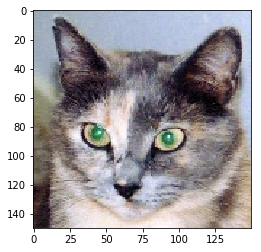

In [8]:
plt.imshow(img)
plt.show()

### Instantiating a new model

We need to visualize the output of all the layers outputs. If we just run the image through the uploaded model we will just get the output. So using the old model we will be instantiating a new models object where we will set the input tensor as the same input, but define the output to be all layer outputs. 

This is the first time we have dealt with multiple outputs model. Till now all the models had a single input and single output. Here for 1 input image we will have 8 outputs corresponding to first 8 layers. 

In [9]:
from keras import models

layer_outputs = [layer.output for layer in model.layers[:8]] ## After 8 layers we have flattening
activation_model = models.Model(input = model.input, outputs = layer_outputs)

/home/yash/anaconda3/envs/tf36/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=[<tf.Tenso..., inputs=Tensor("co...)`
  after removing the cwd from sys.path.


In [10]:
activation_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_25_input (InputLayer) (None, 150, 150, 3)       0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 17, 17, 128)       0         
__________

In [11]:
activations = activation_model.predict(img_tensor)

***The model returns a list of Numpy arrays where each list element corresponds to 1 output***

In [12]:
len(activations)

8

In [13]:
activations[0].shape

(1, 148, 148, 32)

In [14]:
%matplotlib inline
import matplotlib.pyplot as plt

/home/yash/anaconda3/envs/tf36/lib/python3.6/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide


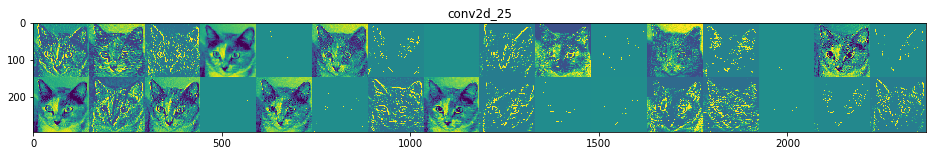

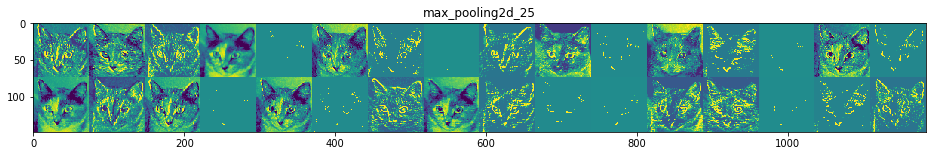

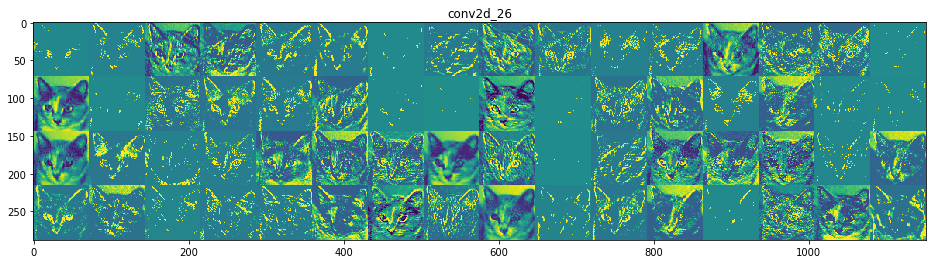

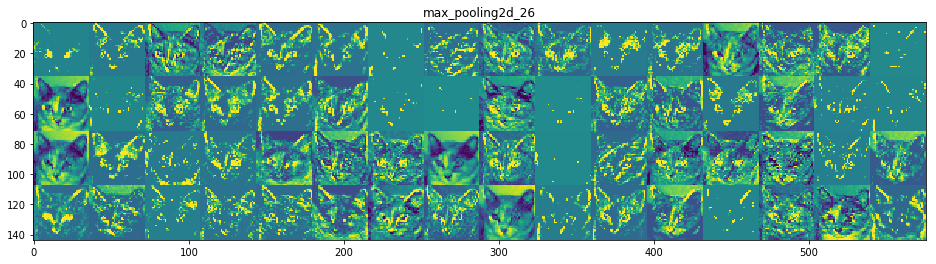

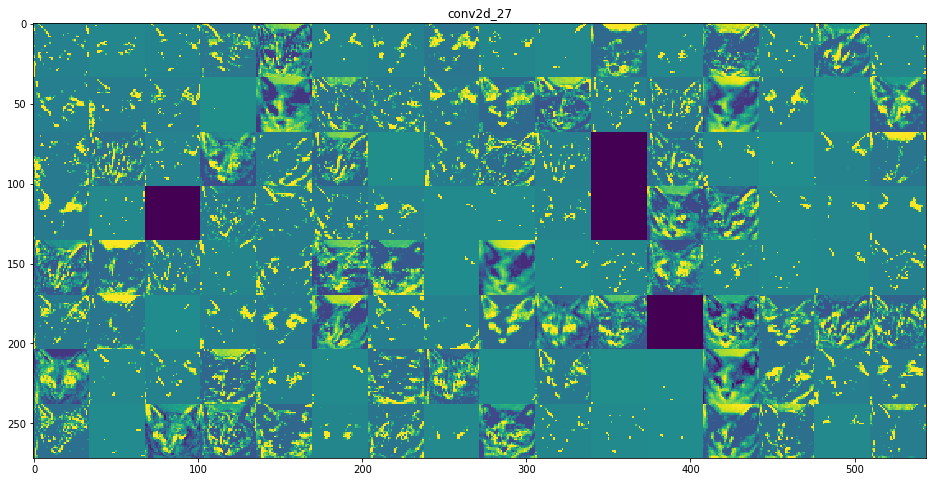

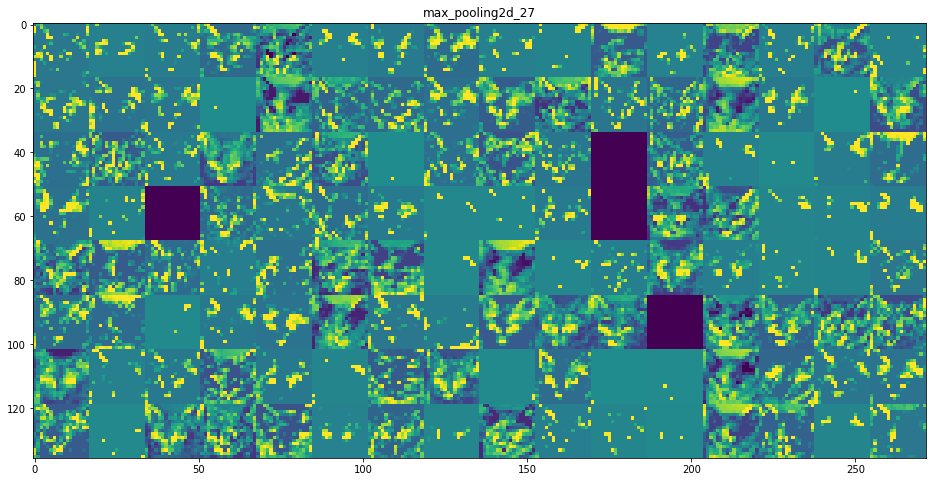

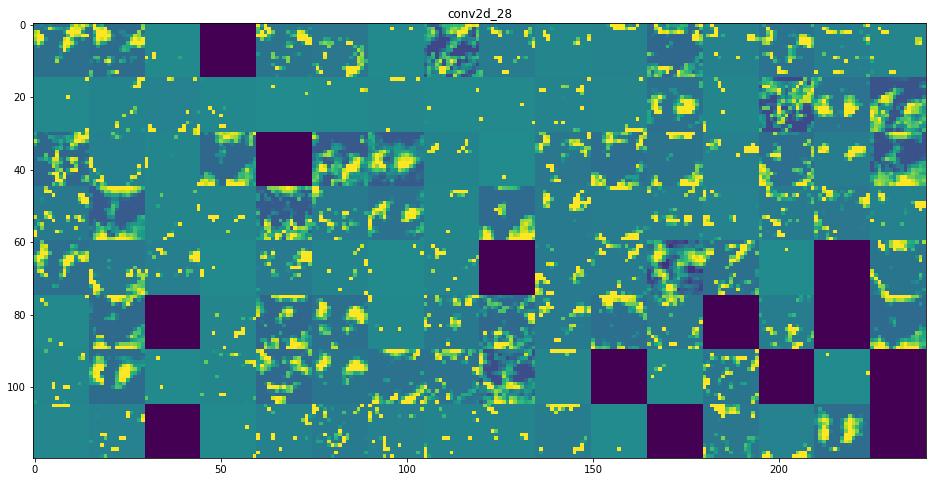

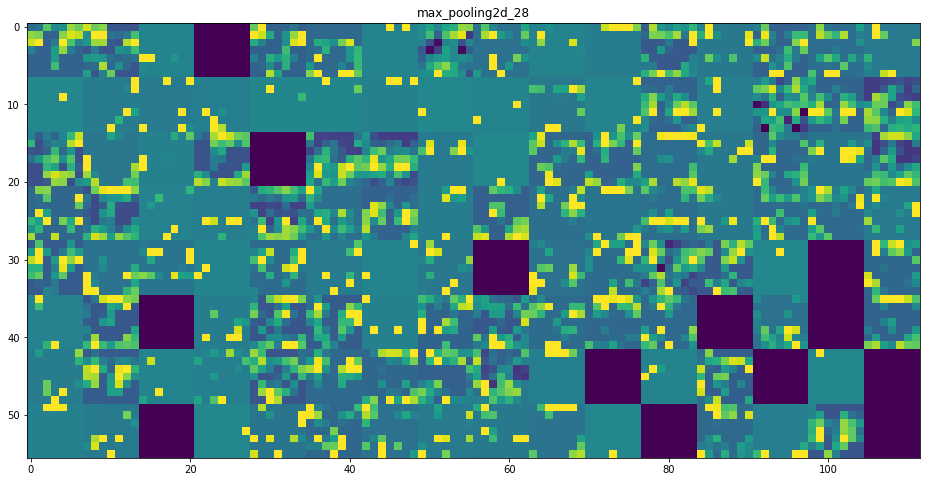

In [15]:
### Writing a loop which iterates through the activations and assigns the value to a grid for each activation
### output. Then using matplotlib to display the grid.

layer_names = [] 
for layer in model.layers[:8]:
    layer_names.append(layer.name)
    
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    
    n_cols = n_features//images_per_row
    display_grid = np.zeros((size*n_cols, images_per_row*size))
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:,:,col*images_per_row + row]
            
            
            ### Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0 , 255).astype('uint8')
            display_grid[col*size:(col+1)*size,
                        row*size : (row+1)*size] = channel_image
    scale = 1./size
    plt.figure(figsize=(scale*display_grid.shape[1], scale*display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

### The few things to notice over here-

1. The first layer acts as a collection of various edge detectors. At this stage, the activations retain almost all the information presesnt in the initial picture. 
2. As you go higher, the activations become increasingly abstract and less visually interpretable. They begin to encode higher-level concepts such as "cat-ear" and "cat-eye". Higher presentations carry increasingly less information about the visual contents of the image, and increasingly more information to the class of the image. 
3. The sparsity of the activations increases with depth of the layer: in the first layer, all filters are activated by the input image; but in the following layers, more and more features are blank. this means the pattern encoded by the filter isn't found in the input image

***The information learned by the layer becomes increasingly abstract with the depth of the layer. The deep neural network acts as a information distillation pipeline, with raw data being going in and being repeatedly transformed so that irrelevant information is filtered out. This is completely analogous to how human brain percieves an image. When we look at images we are able to remember the abstract details like which objects are there, for example a car, or bicycle, but when asked to draw it we won't be able to get into the details.*** 

--------------------------------------------------------------------------------------------------------------
### Visualizing Convnets Filters
--------------------------------------------------------------------------------------------------------------

Another way to understand how Conv Net works is to visualize what each filters respond to. This can be done with *gradient ascent* in input space: i.e. applying gradient descent to the value of the input image of a convnet so as to maximize the response of a specific filter, starting from a blank input image. The resulting input image would be the one that the chosen filter is maximally responsive to. 

**The process:** 
Build a loss function that maximizes the value of a given filter in a given convolution layer, and then you'll SGD to adjust the values of the input image so as to maximize this activation value. 

The above process may seem a little confusing. Following the code line by line makes it clear. 


In [16]:
from keras.applications import VGG16
from keras import backend as K

In [17]:
model = VGG16(weights= 'imagenet',
             include_top = False)

In [18]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

In [19]:
### We will be working with the following layer and filter for starters

layer_name = 'block3_conv1'
filter_index = 0

In [20]:
### Getting the output of the same layer

layer_output = model.get_layer(layer_name).output

In [21]:
### Defining the loss function as the mean of all values outputted by that filter.

loss = K.mean(layer_output[:,:,:,filter_index])

In [22]:
### Gradients call returns a list of tensors. 
### Here since we need to Maximize the loss(here loss is same as the output of the filter)

grads = K.gradients(loss, model.input)[0]

In [23]:
### This step is not completely necessary but helps as here we are Normalzing the gradient value obtained 
### using the L2 norm of the gradient.  This ensures that the update range remains within the same specific 
### change. 

grads /= (K.sqrt(K.mean(K.square(grads)))+1e-5)  

In [24]:
### Now, we need to define a function which takes in model_input and computes the loss and gradient

iterate = K.function([model.input], [loss,grads])

In [25]:
import numpy as np 

loss_value, grads_value = iterate([np.zeros((1,150,150,3))])

In [26]:
input_img_data = np.random.random((1,150,150,3))*20 + 128

In [27]:
step = 1

In [28]:
for i in range(40):
    loss_value, grads_value = iterate([input_img_data])
    input_img_data += grads_value*step

In [29]:
### We now normalize the image before printing the image

def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    
    x += 0.5
    x = np.clip(x,0,1)
    x *= 255
    x = np.clip(x,0,255).astype('uint8')
    return x

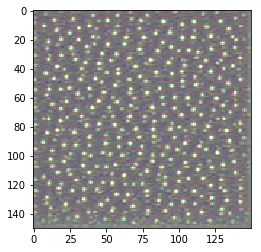

In [30]:
plt.imshow(deprocess_image(input_img_data[0]))

In [31]:
### Defininng the same as a function for Convienience.

def generate_pattern(layer_name, filter_index, size = 150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:,:,:,filter_index])
    
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads)))+1e-5)  
    
    iterate = K.function([model.input], [loss,grads])
    input_img_data = np.random.random((1,150,150,3))*255
    step = 1
    
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value*step
    img = input_img_data[0]
    return deprocess_image(img)

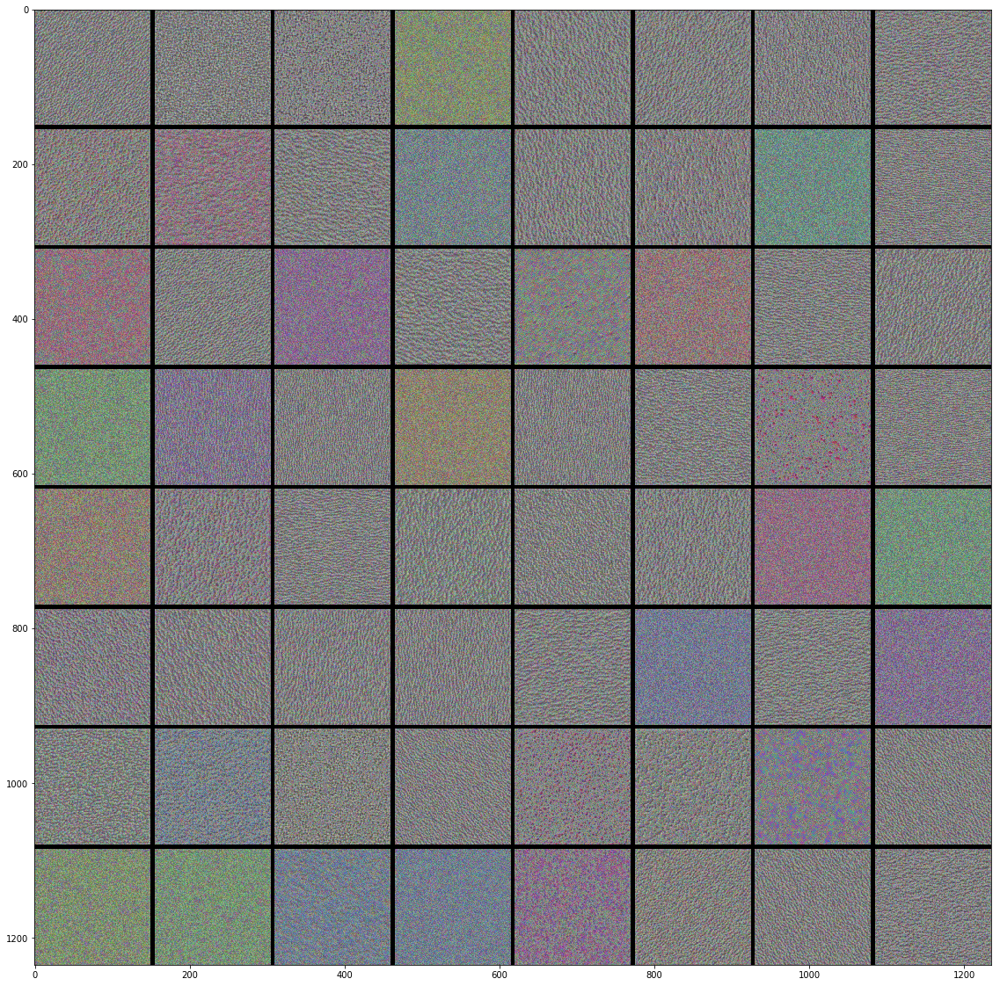

In [32]:
### Creating a grid of all the activations for all the layers

layer_name = 'block1_conv2'
size = 150
margin = 5

results = np.zeros((8*size + 7 * margin, 8*size + 7 * margin, 3))

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j*8), size = size)
        
        horizontal_start = i *size + i*margin
        horizontal_end = horizontal_start + size
        vertical_start = j*size + j*margin
        vertical_end = vertical_start + size
        results[horizontal_start:horizontal_end, vertical_start : vertical_end, :] = filter_img
        

plt.figure(figsize=(20,20))
plt.imshow(results.astype('uint8'))
plt.show()

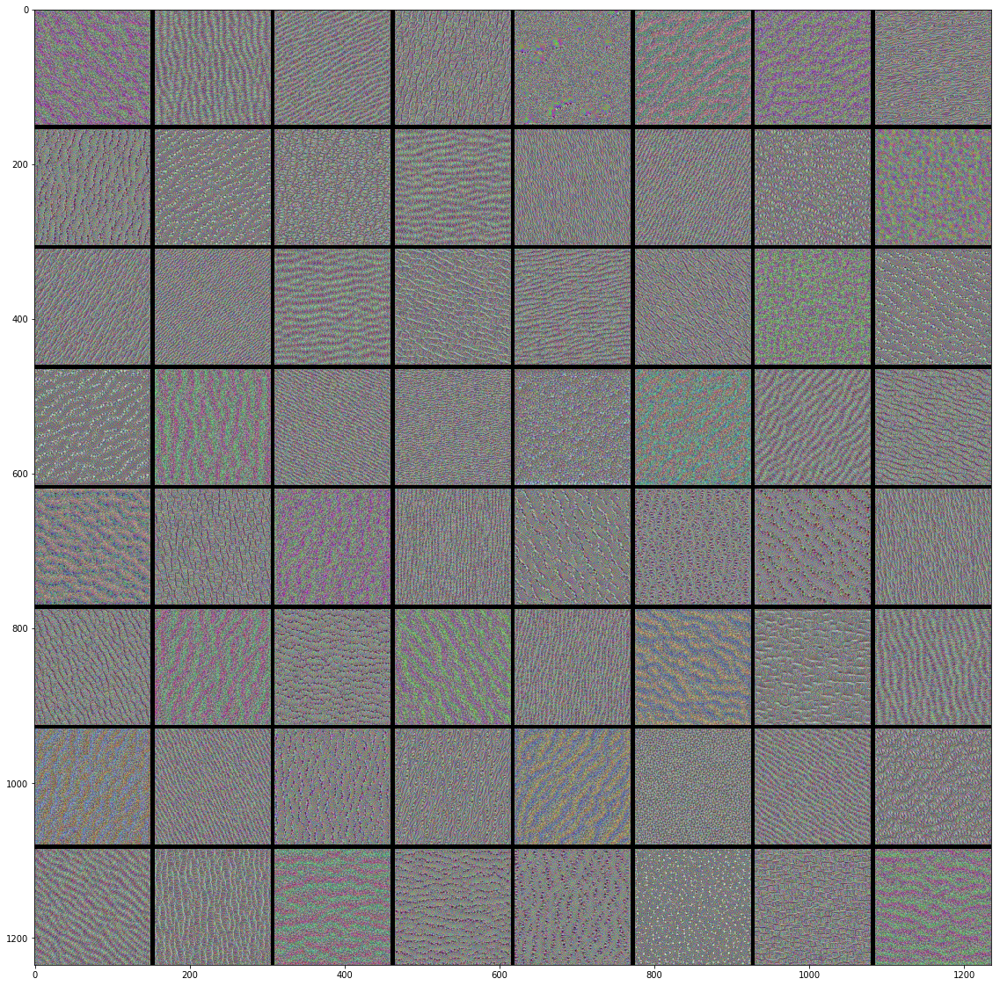

In [33]:
### Creating a grid of all the activations for all the layers

layer_name = 'block2_conv2'
size = 150
margin = 5

results = np.zeros((8*size + 7 * margin, 8*size + 7 * margin, 3))

for i in range(8):
    for j in range(8):
        filter_img = generate_pattern(layer_name, i + (j*8), size = size)
        
        horizontal_start = i *size + i*margin
        horizontal_end = horizontal_start + size
        vertical_start = j*size + j*margin
        vertical_end = vertical_start + size
        results[horizontal_start:horizontal_end, vertical_start : vertical_end, :] = filter_img

plt.figure(figsize=(20,20))
plt.imshow(results.astype('uint8'))
plt.show()

--------------------------------------------------------------------------------------------------------------
### Visualizing Heatmaps of Class Activation 
--------------------------------------------------------------------------------------------------------------

Also known as Class Activation Map(CAM) Visualization, this technique helps in the process of debugging in case of class misclassifications. COnsider the cat vs dog classification, this technique helps us to visualize what parts of the image were Cat like and what part of the image were Dog like, which is eventually how the image gets classified. 

***The specific implementation being used here is the known as Grad-CAM: Visual Explanations from Deep networks using Gradient based LOcalization***.

Process : 
1. Take the output feature map of the CNN, given an input image, and weighing every channel in the feature map by the gradient of the class with respect to channel.
Intuition: Esentially weighing how intensely the image activates different channels to how important is each channel with regard to the class under consideration. 

--------------------------------------------------------------------------------------------------------------

Let us start by taking the VGG Network- 

--------------------------------------------------------------------------------------------------------------

In [35]:
from keras.applications.vgg16 import VGG16
model = VGG16(weights = 'imagenet')

553467904/553467096 [==============================] - 96s 0us/step


In [55]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

In [56]:
img_path = 'elephants.jpeg'
img = image.load_img(img_path, target_size=(224,224))

In [57]:
x = image.img_to_array(img) 
x = np.expand_dims(x, axis=0) ### Adds a batch dimension 
x = preprocess_input(x)   ## Performs channel wise Normalization

In [58]:
preds = model.predict(x)

In [59]:
decode_predictions(preds, top=3)[0]

[('n02504458', 'African_elephant', 0.9152492),
 ('n01871265', 'tusker', 0.08059514),
 ('n02504013', 'Indian_elephant', 0.004110205)]

In [60]:
np.argmax(preds[0])

386

This implies that the class "African Elephants" is at index 386. 

------------------------------------------------------------------------------------------------------------------
### Setting up the Grad-CAM Algorithm

------------------------------------------------------------------------------------------------------------------

In [61]:
ae_output = model.output[:,386]

last_conv_layer = model.get_layer('block5_conv3') ### Last CNN layer in VGG16


### The parameters to the gradient function are loss and then input i.e. 
### gradients returns  of the gradient of loss with respect to input

### Here we are finding the gradient of class output with respect to the CNN last layer output

### Also look at the VGG16 model above, the last CNN layer has 512 filters. 
grads = K.gradients(ae_output, last_conv_layer.output)[0]

In [62]:
grads.shape

TensorShape([Dimension(None), Dimension(14), Dimension(14), Dimension(512)])

In [63]:
### Finding the mean for all the filters 

pooled_grads = K.mean(grads, axis=(0,1,2))

In [64]:
pooled_grads.shape

TensorShape([Dimension(512)])

In [65]:
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

In [67]:
pooled_grads_value, conv_layer_output_value = iterate([x])

In [68]:
### Using the gradient calculated which is with respect to each of 
### the filters and multiplying it with the corresponding filters output. 
### This is done as the gradient here tells us that how important is that
### filter is with respect to the class under consideration

for i in range(512):
    conv_layer_output_value[:,:,i] *= pooled_grads_value[i]

In [69]:
heatmap = np.mean(conv_layer_output_value, axis = -1)

In [70]:
heatmap = np.maximum(heatmap, 0)

In [71]:
heatmap /= np.max(heatmap)

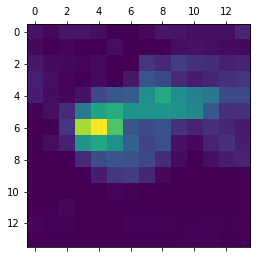

In [72]:
plt.matshow(heatmap)

In [73]:
import cv2

In [76]:
img = cv2.imread(img_path)

In [78]:
heatmap = cv2.resize(heatmap, (np.shape(img)[1], np.shape(img)[0]))
heatmap = np.uint8(255*heatmap)

In [79]:
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

In [81]:
superimposed_img = heatmap * 0.4 + img

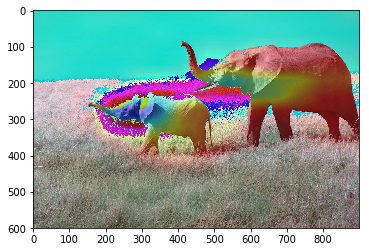

In [83]:
# cv2.imwrite('elephants_cam.jpeg', superimposed_img)
imgplot = plt.imshow(superimposed_img.astype('uint8'))

***If noticed carefully it can be seen that the ears of the calf elephant are one of the reasons it is getting strongly classified as an African Elephant. This might be the distinguishing factor between the African and Indian Elephant. Using heatmaps we can visually understand which characterstics are being understood by the model and maybe work on augmenting the dataset or tweaking the model if the model is unable to capture the distinguishing feature.***